<a href="https://colab.research.google.com/github/GerlianeChaves/processamentodeimagens/blob/main/pi_cap6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **CAPITULO 6**

## Configurações

In [ ]:
#imports 
import cv2
import numpy as np
from google.colab.patches import cv2_imshow 
import matplotlib.pyplot as plt 
import random
from skimage.color import rgb2gray

In [ ]:
#conecta com o google drive
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


## QUESTÃO 1
1. Abra a imagem Fig0304(a)(breast_digital_Xray) e faça a transformada da inversa.

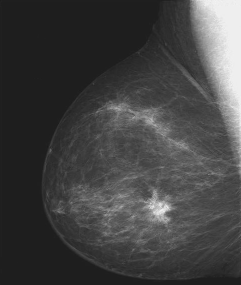

Imagem Original
(285, 241)


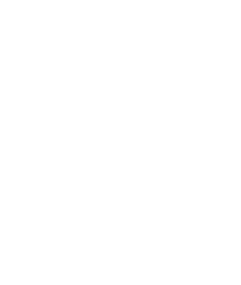

Imagem com transformada
(285, 241)


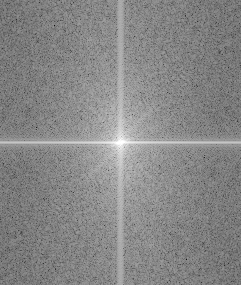

Imagem com transformada
(285, 241)


In [ ]:
#apresenta imagem original
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0304(a)(breast_digital_Xray).tif', 255)

cv2_imshow(img)
print('Imagem Original')
print(img.shape)

img_float32 = np.float32(img)

dft = cv2.dft(np.float32(img),flags = cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)
f_ishift = np.fft.ifftshift(dft_shift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1])

cv2_imshow(img_back)
print('Imagem com transformada')
print(img.shape)

#dft
img_float32 = np.float32(img)

dft = cv2.dft(img_float32, flags = cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))
cv2_imshow(magnitude_spectrum)
print('Imagem com transformada')
print(img.shape)


## QUESTÃO 2
2. Abra a imagem Fig0305(a)(DFT_no_log), utilize a transformada logarítmica

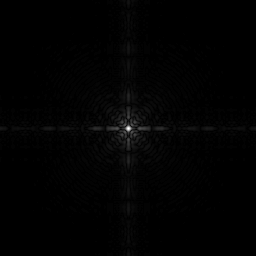

Imagem Original
(256, 256, 3)


<ipython-input-21-a414240155e6>:8: RuntimeWarning: divide by zero encountered in log
  log_image = c * (np.log(img + 1))


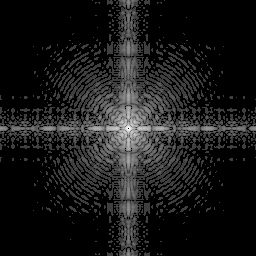

Imagem com transformada logaritmica
(256, 256, 3)


In [ ]:
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0305(a)(DFT_no_log).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)

c = 255 / np.log(1 + np.max(img)) 
log_image = c * (np.log(img + 1)) 
   
log_image = np.array(log_image, dtype = np.uint8)
cv2_imshow(log_image)
print('Imagem com transformada logaritmica')
print(img.shape)



## QUESTÃO 3
3. Na imagem Fig0308(a)(fractured_spine) faça transformadas de potência (gama) com c = 1 e
diferentes γ. O que você pode observar nas imagens resultantes? Qual melhor valor para γ
você encontrou?

REFERÊNCIAS (QUESTÕES 3 e 4): https://github.com/VitoriaCarvalho/VisaoComputacional

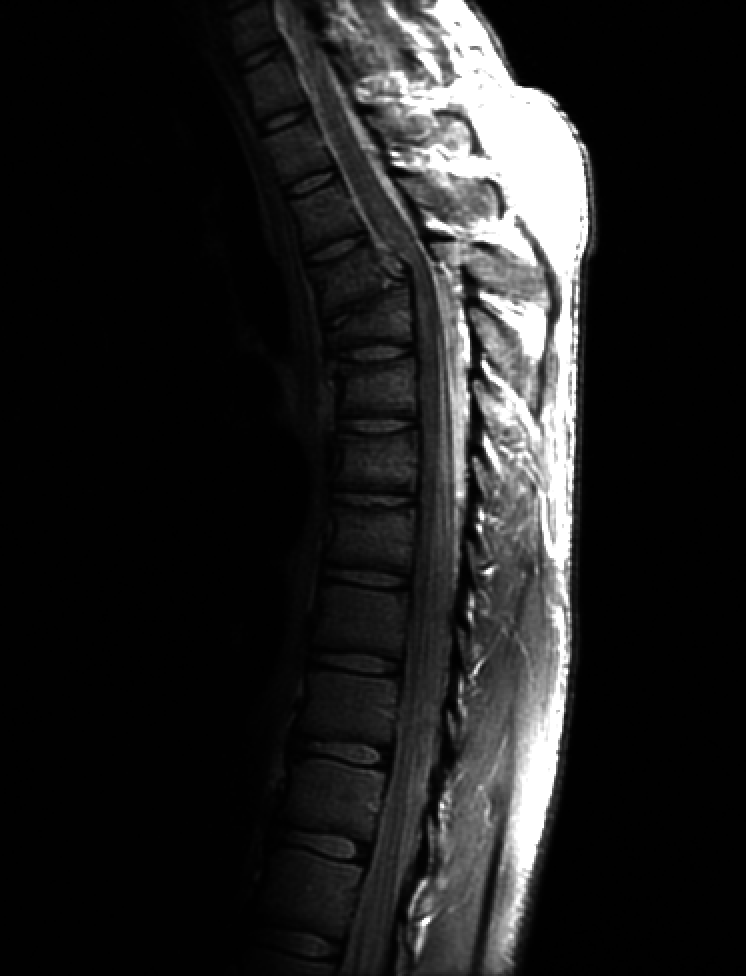

Imagem Original
(976, 746, 3)


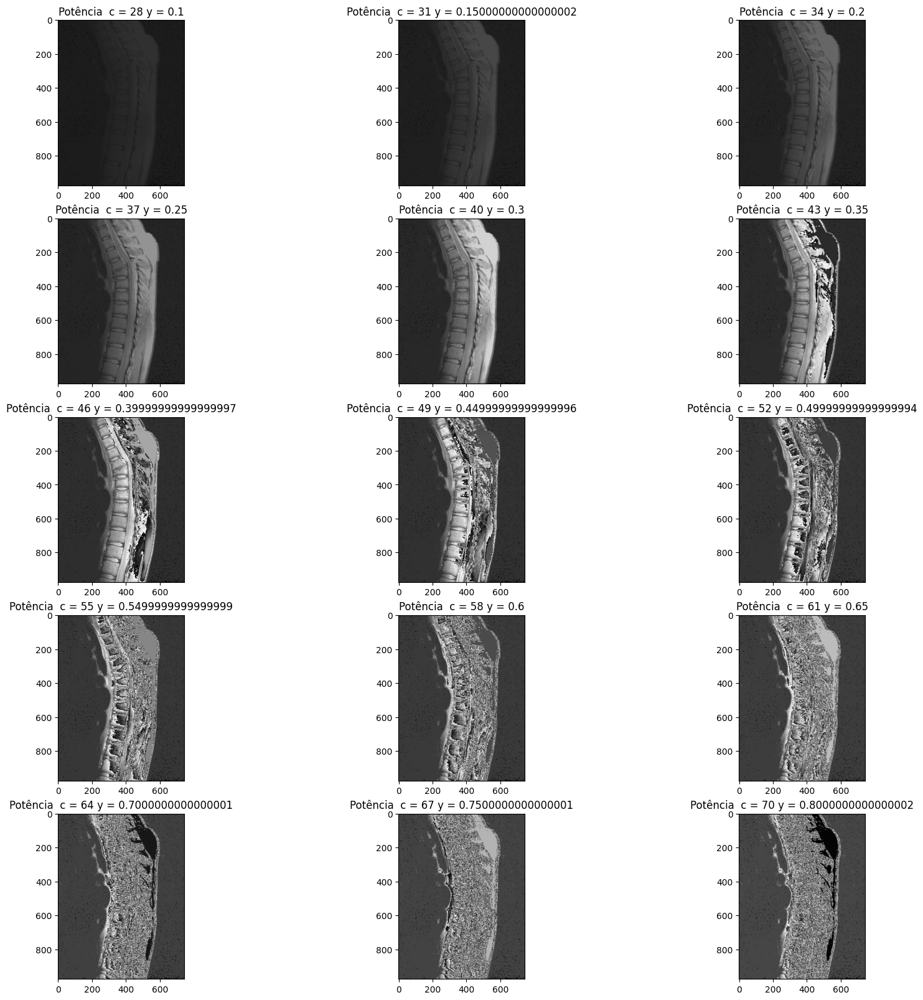

In [ ]:
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0308(a)(fractured_spine).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)

def potencia(img, c, y):
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            img[i][j] = c*img[i][j]**y

    return img

#Plotando a potência
fig,pot = plt.subplots(5,3,figsize=(20,20))
l = c = 0
y = 0.1
const = random.randint(1, 50)
for i in range(15):
    new = img.copy()
    pot[l, c].imshow(potencia(new, const, y),cmap = "gray")
    pot[l, c].set_title('Potência  c = ' + str(const) + ' y = ' + str(y))
    c += 1
    if(c == 3):
        c = 0
        l += 1
    const+=3
    y+=0.05



## QUESTÃO 4
4. Utilizando a imagem Fig0314(a)(100-dollars) realize um fatiamento de plano de bits. Em
seguida reconstrua a imagem original utilizando os planos 8 e 7, planos 8, 7 e 6 e planos 8,
7, 6 e 5. O que se pode observar nestas imagens resultantes?


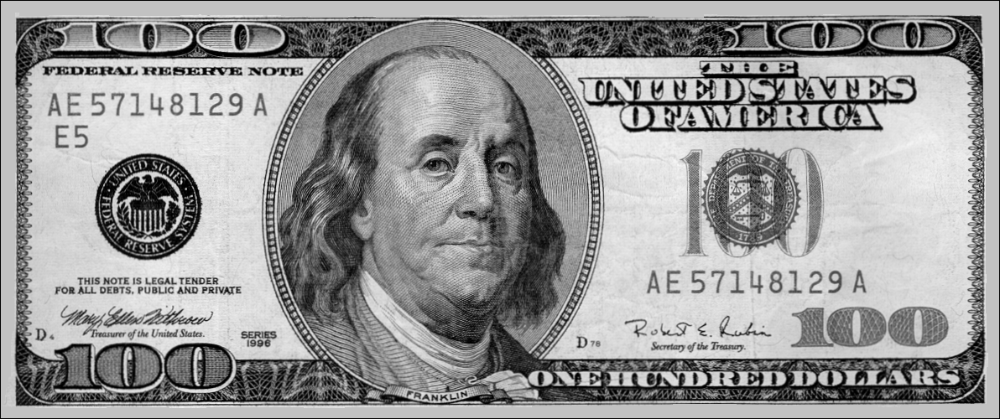

Imagem Original
(500, 1192, 3)


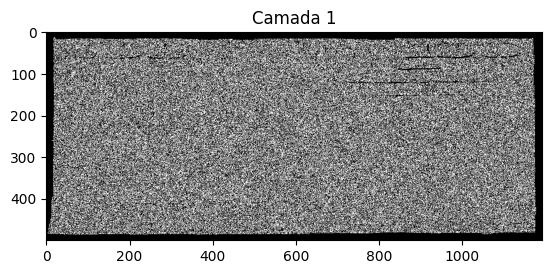

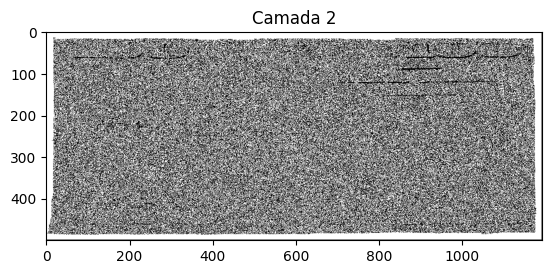

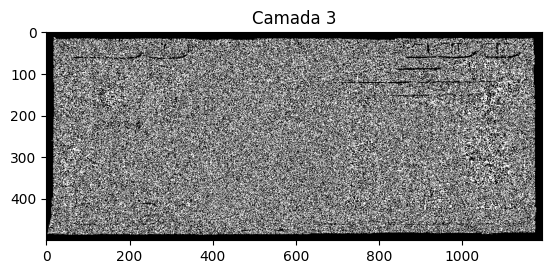

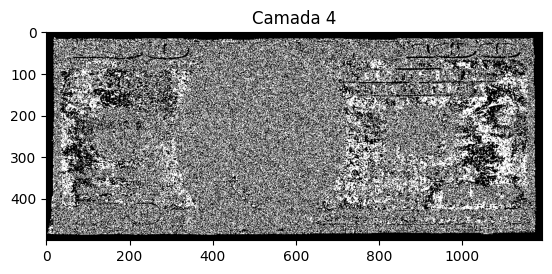

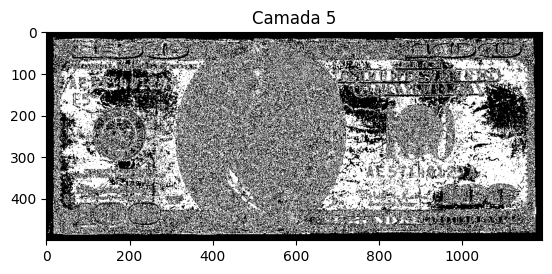

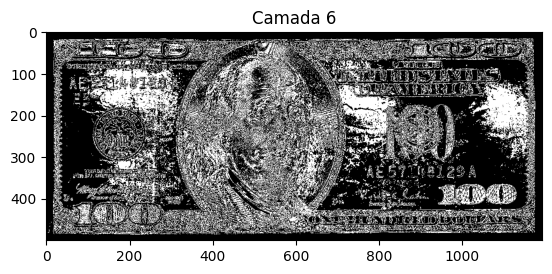

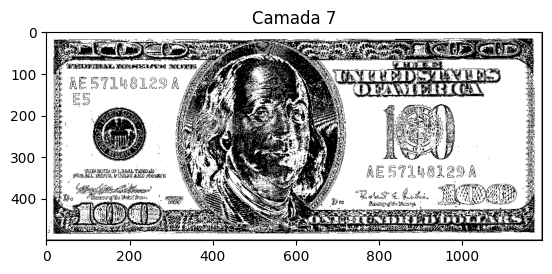

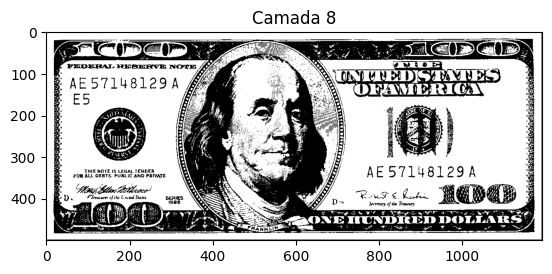

In [ ]:
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0314(a)(100-dollars).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)

def decimalToBinary(n):  
    return bin(n).replace("0b", "")

def preencherComZeros(binary, qtdBits):
    bits = []
    sobra = 0
    if(len(binary) < qtdBits):
        sobra = qtdBits - len(binary)
    c = 0
    for i in range(qtdBits):
        if(i <= sobra-1):
            bits.append(0)
        else:
            bits.append(int(binary[c]))
            c += 1
    return bits

def binaryToDecimal(n): 
    num = n; 
    dec_value = 0; 
      
    # Initializing base  
    # value to 1, i.e 2 ^ 0 
    base = 1; 
      
    temp = num; 
    while(temp): 
        last_digit = temp % 10; 
        temp = int(temp / 10); 
          
        dec_value += last_digit * base; 
        base = base * 2; 
    return dec_value;

def planoDeBits(img, qtdBits):
    
    camadas = []
    for i in range(qtdBits):
        camadas.append(img.copy())
        
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            binary = decimalToBinary(int(img[i][j]*256))
            bits = preencherComZeros(binary, qtdBits)
            for k in range(qtdBits):
                camadas[k][i][j] = bits[qtdBits-1-k]
                
    for i in range(qtdBits):
        plt.figure()
        plt.title('Camada ' + str(i+1))
        plt.imshow(camadas[i],cmap = 'gray')
        

img = rgb2gray(img)
qtdBits = 8
planoDeBits(img, qtdBits)

In [ ]:
weightedSum = cv2.addWeighted(image1, 0.5, image2, 0.4, 0) 
cv2.imshow('Weighted Image', weightedSum)

## QUESTÃO 5
5. Faça uma equalização de histograma na Fig0316(1)(top_left).Em seguida faça o plot de uma
figura que contenha 4 imagens: a imagem original, o histograma da imagem original, a
imagem com o histograma equalizado, o histograma da imagem equalizada. O que se pode
concluir com este resultado?

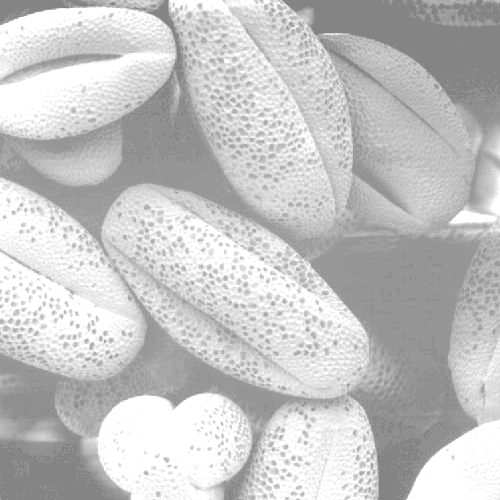

Imagem Original
(500, 500, 3)


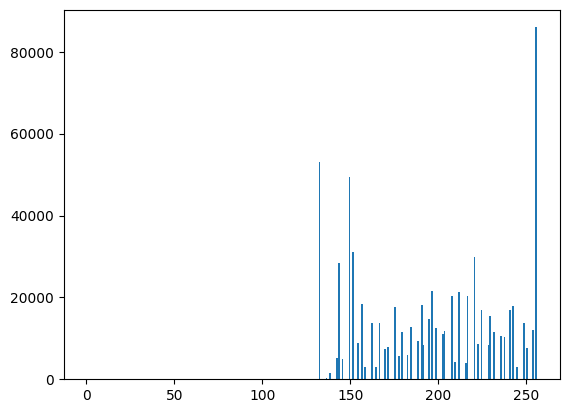

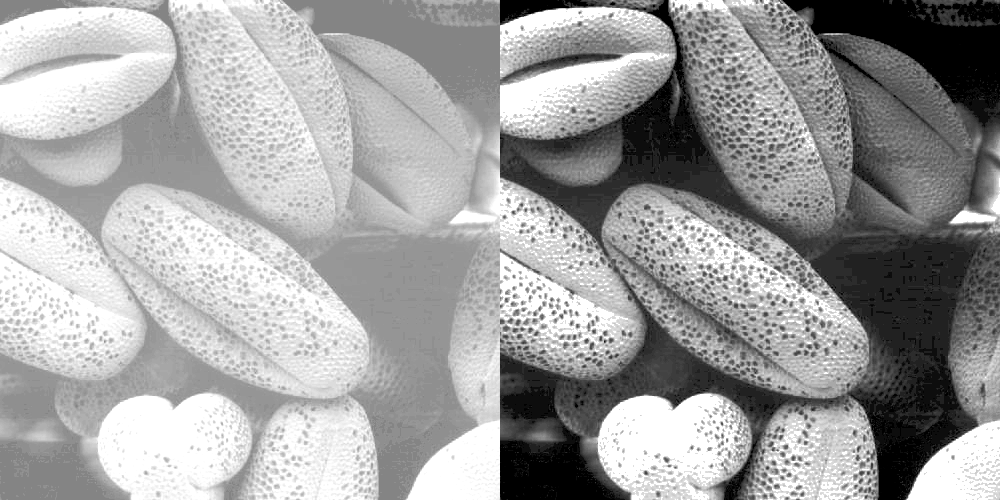

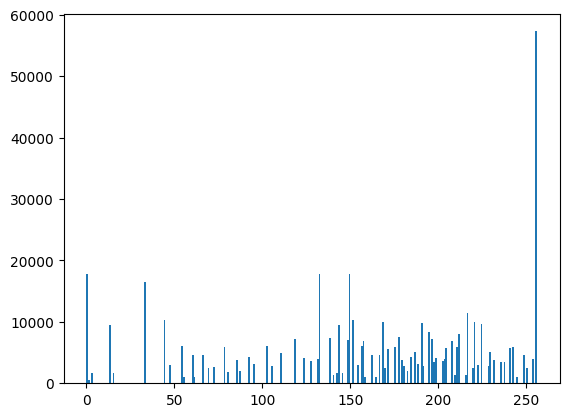

In [ ]:
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0316(1)(top_left).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)
plt.hist(img.ravel(),256,[0,256]) 
plt.show() 

grayimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

eq = cv2.equalizeHist(grayimg) 
res = np.hstack((grayimg, eq)) 
cv2_imshow(res)

plt.hist(res.ravel(),256,[0,256]) 
plt.show() 

## QUESTÃO 6
6. Utilizando a Fig0326(a)(embedded_square_noisy_512) faça uma equalização de histograma
global e outra local. Plote o resultado. O que se observa neste resultado?

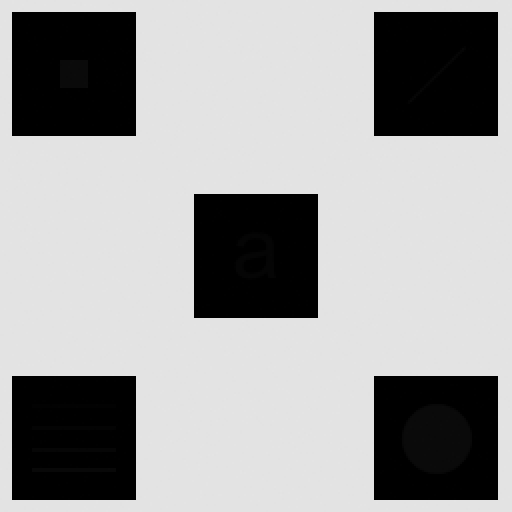

Imagem Original
(512, 512, 3)


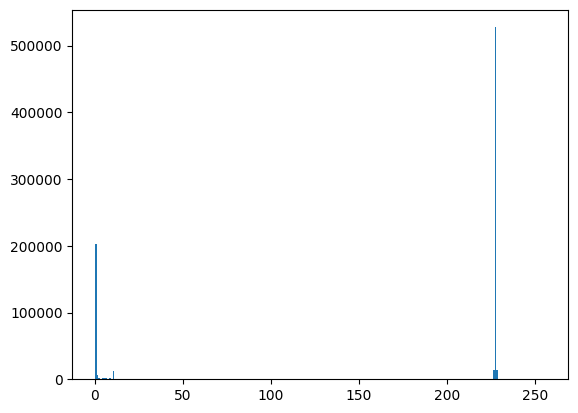

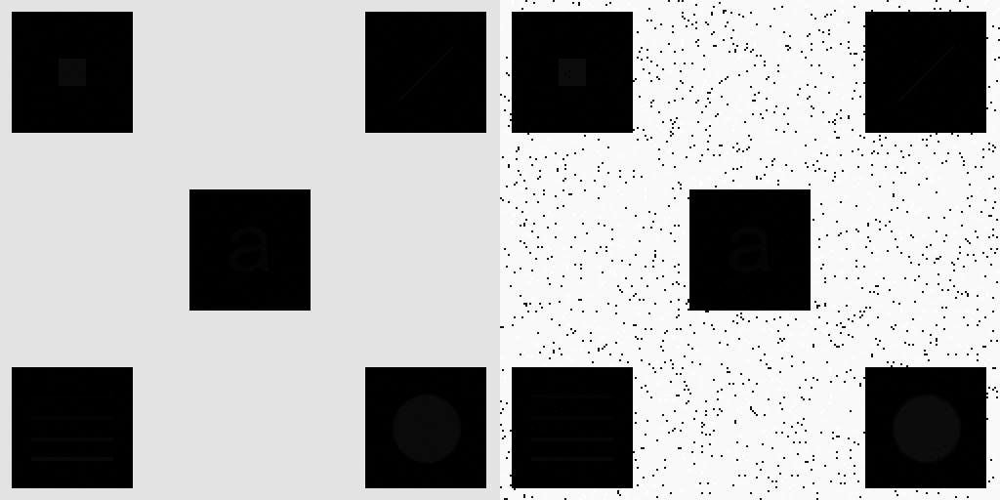

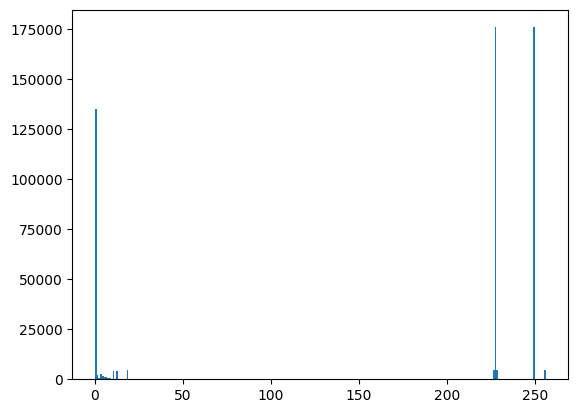

In [ ]:
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0326(a)(embedded_square_noisy_512).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)
plt.hist(img.ravel(),256,[0,256]) 
plt.show() 

grayimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

eq = cv2.equalizeHist(grayimg) 
res = np.hstack((grayimg, eq)) 
cv2_imshow(res)

plt.hist(res.ravel(),256,[0,256]) 
plt.show() 

## QUESTÃO 7
7. Na imagem Fig0333(a)(test_pattern_blurring_orig) faça uma filtragem de média utilizando
máscaras com tamanhos de 3, 5, 9, 15 e 35. Plote todas as imagens e descreva o que se
observou neste processo.

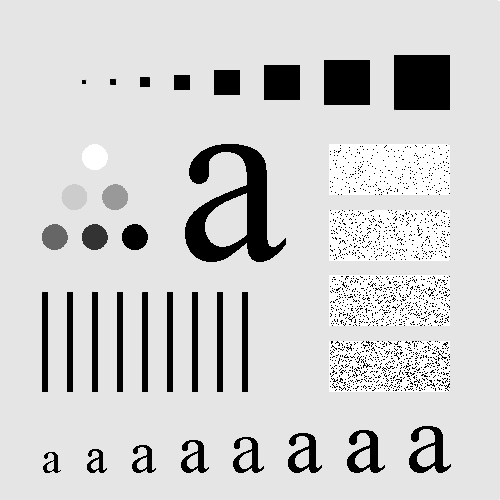

Imagem Original
(500, 500, 3)
Tamanho 3


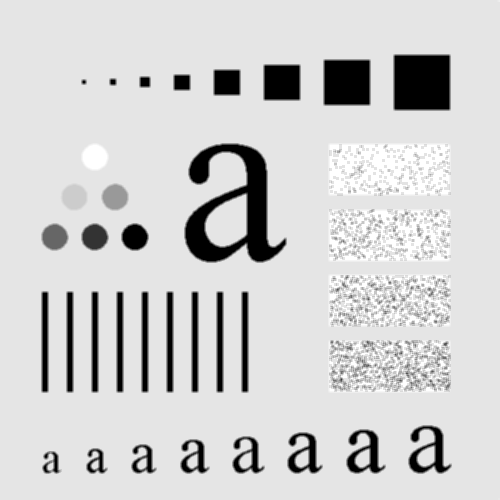

Tamanho 5


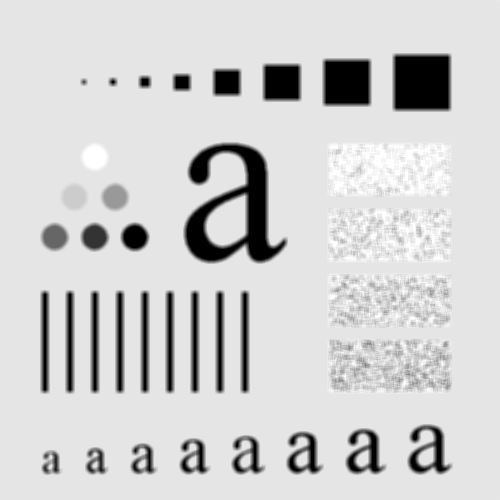

Tamanho 9


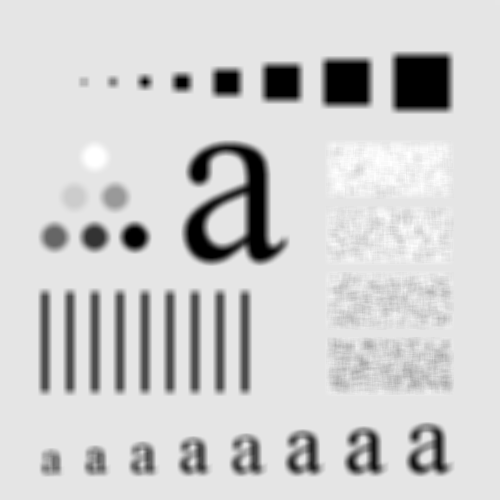

Tamanho 15


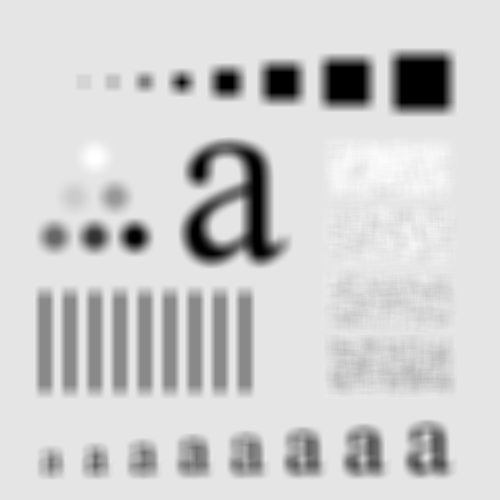

Tamanho 35


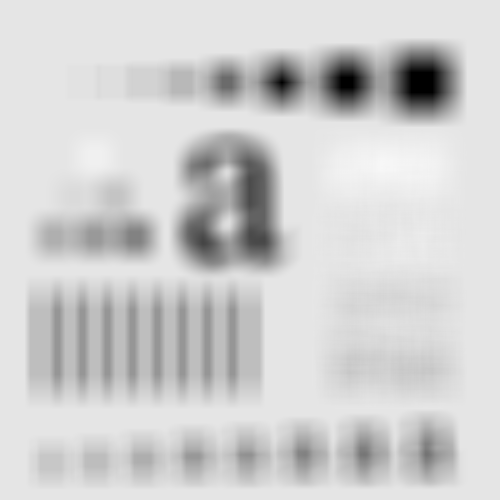

In [ ]:
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0333(a)(test_pattern_blurring_orig).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)

print('Tamanho 3')
filter_blur=cv2.blur(img,ksize=(3,3))
cv2_imshow(filter_blur)

print('Tamanho 5')
filter_blur5=cv2.blur(img,ksize=(5,5))
cv2_imshow(filter_blur5)

print('Tamanho 9')
filter_blur9=cv2.blur(img,ksize=(9,9))
cv2_imshow(filter_blur9)

print('Tamanho 15')
filter_blur15=cv2.blur(img,ksize=(15,15))
cv2_imshow(filter_blur15)

print('Tamanho 35')
filter_blur35=cv2.blur(img,ksize=(35,35))
cv2_imshow(filter_blur35)

## QUESTÃO 8 
8. Na imagem Fig0335(a)(ckt_board_saltpep_prob_pt05) faça uma filtragem de média e outra
de mediana. Compare os resultados indicando qual o melhor resultado e explique o porquê.

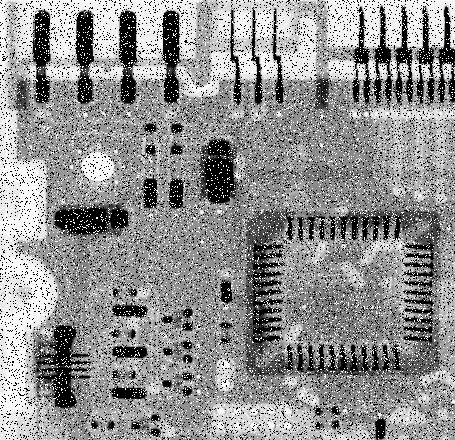

Imagem Original
(440, 455, 3)
Filtro de media


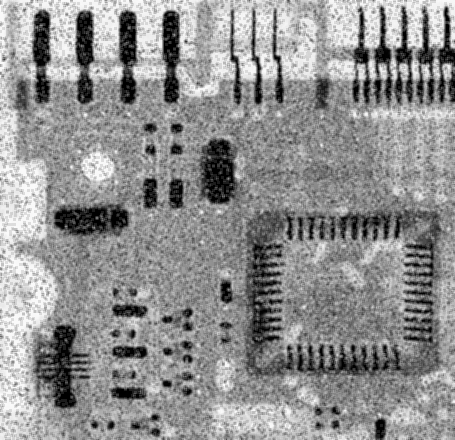

Filtro de mediana


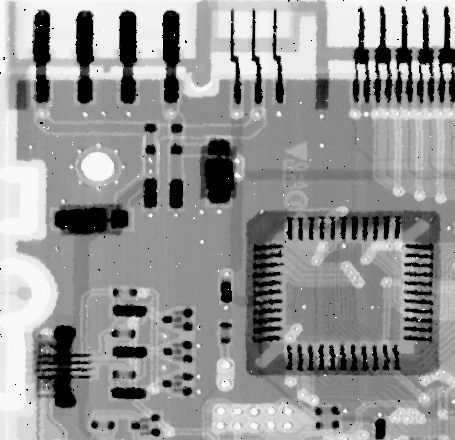

In [ ]:
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0335(a)(ckt_board_saltpep_prob_pt05).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)

#filtro de media
print('Filtro de media')
filter_blur=cv2.blur(img,ksize=(3,3))
cv2_imshow(filter_blur)

#filtro de mediana
print('Filtro de mediana')
median = cv2.medianBlur(img, 3) 
cv2_imshow(median) 


## QUESTÃO 9
9. Na figura Fig0338(a)(blurry_moon) faça um realce utilizando-se de um laplaciano. Plote as
imagens.

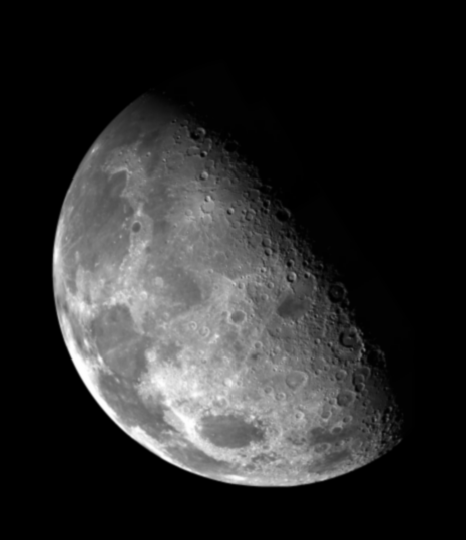

Imagem Original
(540, 466, 3)
Filtro laplaciano


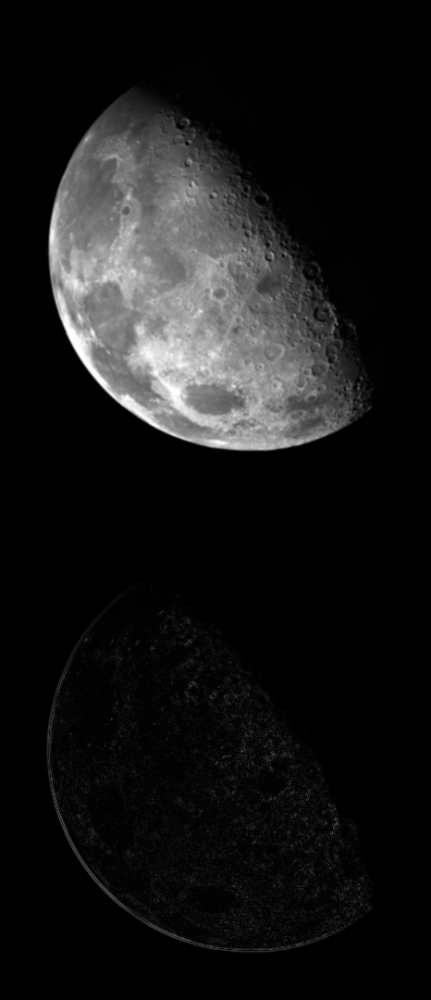

In [ ]:
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0338(a)(blurry_moon).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)

img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
lap = cv2.Laplacian(img, cv2.CV_64F)
lap = np.uint8(np.absolute(lap))
resultado = np.vstack([img, lap])
print('Filtro laplaciano')
cv2_imshow(resultado)

## QUESTÃO 10
10. Faça um realce de imagem utilizando-se da técnica de high-boost na figura
Fig0340(a)(dipxe_text)

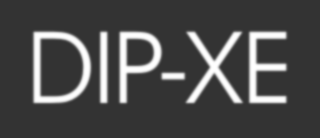

Imagem Original
(138, 320, 3)


error: ignored

In [ ]:
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0340(a)(dipxe_text).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)

def highBoostFiltering(image,boost_factor):
    
    image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #Converting Image to Gray Scale
    resultant_image = image.copy()
    for i in range(1,image.shape[0]-1):
        for j in range(1,image.shape[1]-1):
            blur_factor = (image[i-1, j-1] + image[i-1, j] - image[i-1, j+1] + image[i, j-1] + image[i, j] + image[i, j+1] + image[i+1, j+1] + image[i+1, j] + image[i+1, j+1])/9
            mask = boost_factor*image[i, j] - blur_factor
            resultant_image[i, j] = image[i, j] + mask
            
    return resultant_image

img = cv2.imread('image2.jpg')
factor = 40
output = highBoostFiltering(img, factor)

cv2_imshow(output)

## QUESTÃO 11
11. Aplique as técnicas de Gradiente de Sobel e de Prewitt na Fig0342(a)(contact_lens_original).
O que se pode observar?

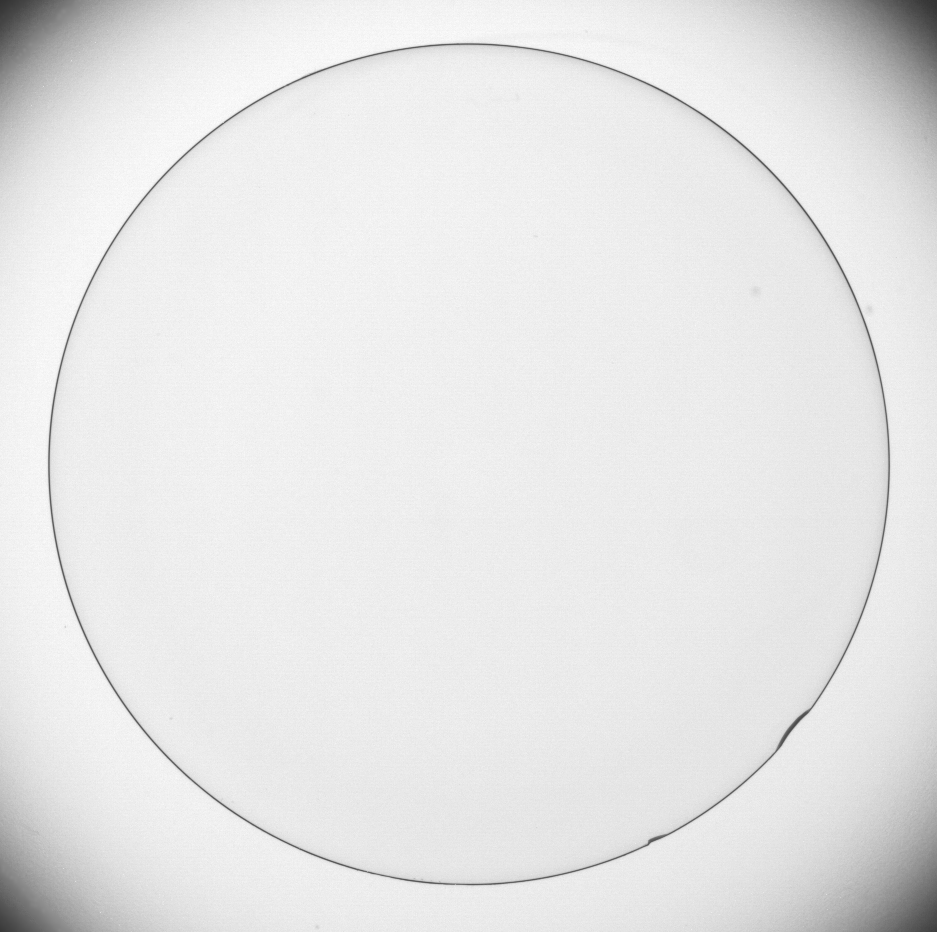

Imagem Original
(932, 937, 3)
Sobel X


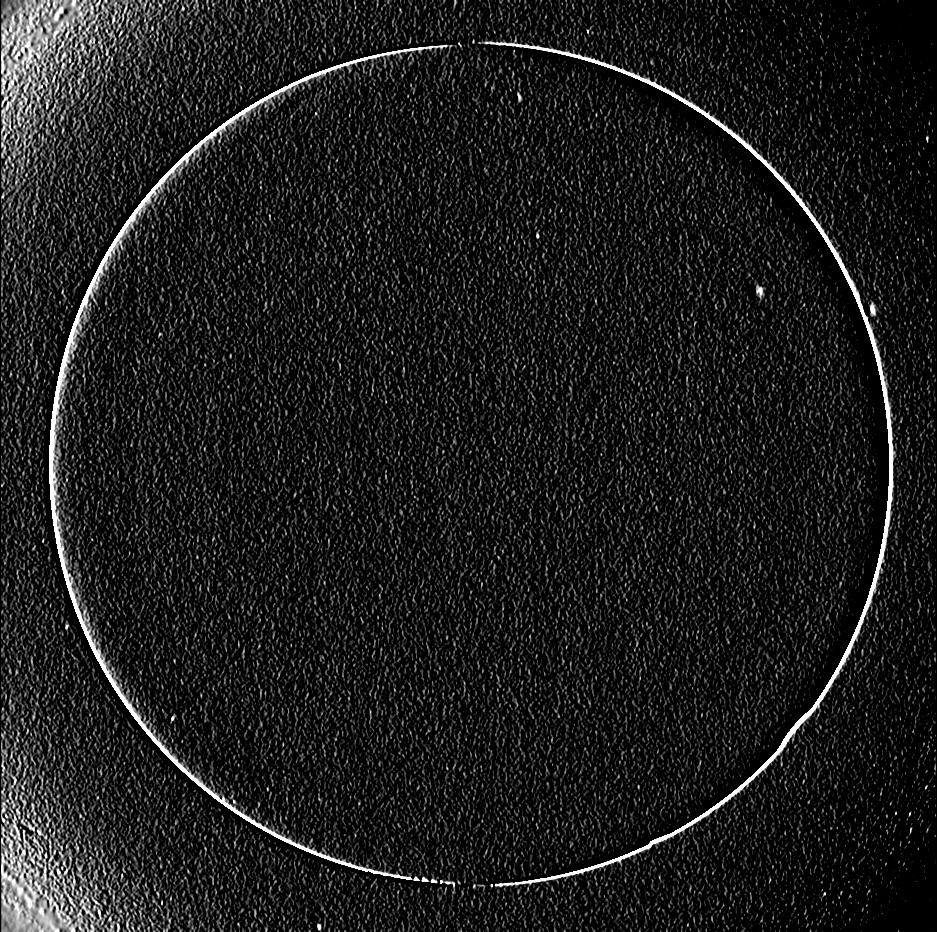

Sobel Y


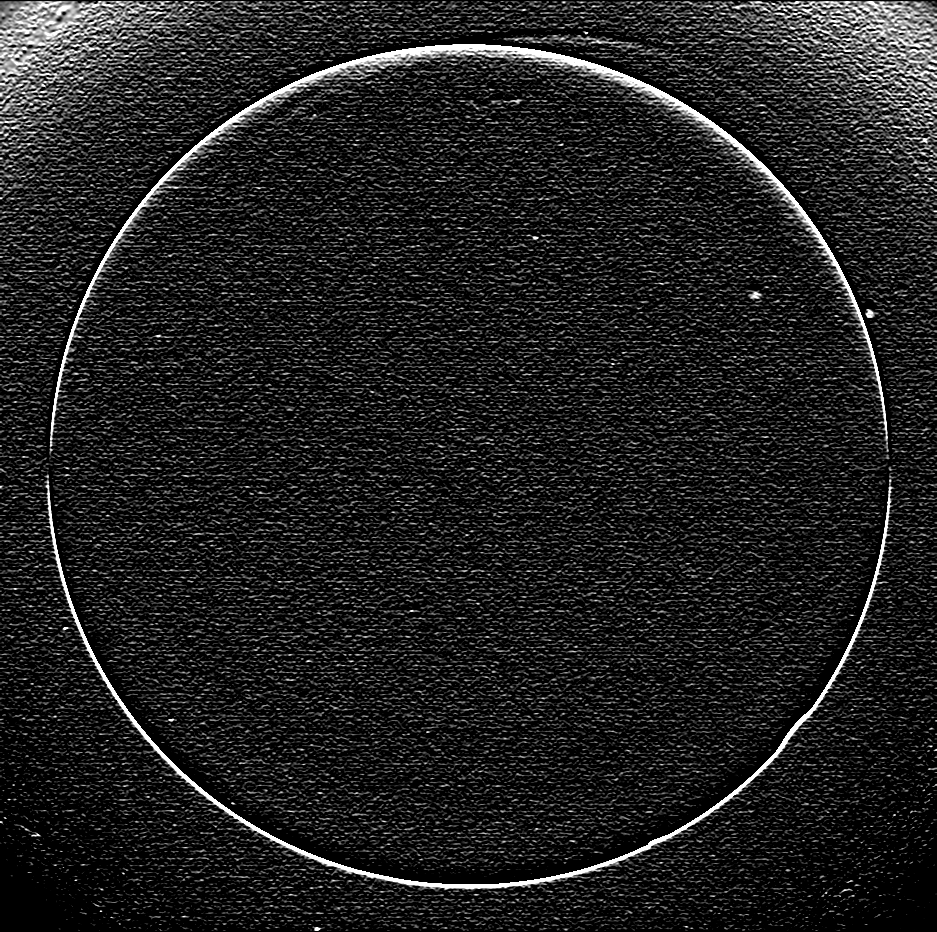

In [ ]:
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0342(a)(contact_lens_original).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)

sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

print('Sobel X')
cv2_imshow(sobelx)
print('Sobel Y')
cv2_imshow(sobely)

## QUESTÃO 12
12. Utilizando a imagem Fig0343(a)(skeleton_orig) faça os seguintes plots:

a) Imagem original

b) Laplaciano

c) Somar as figuras (a) e (b)

d) Gradiente de Sobel de (a)

e) (d) suavizada com um filtro de média 5x5

f) Produto de (c) e (e)

g) Soma de (a) e (f)

h) Transformação de potência.

Compare os resultados de (g) e (h) com (a)

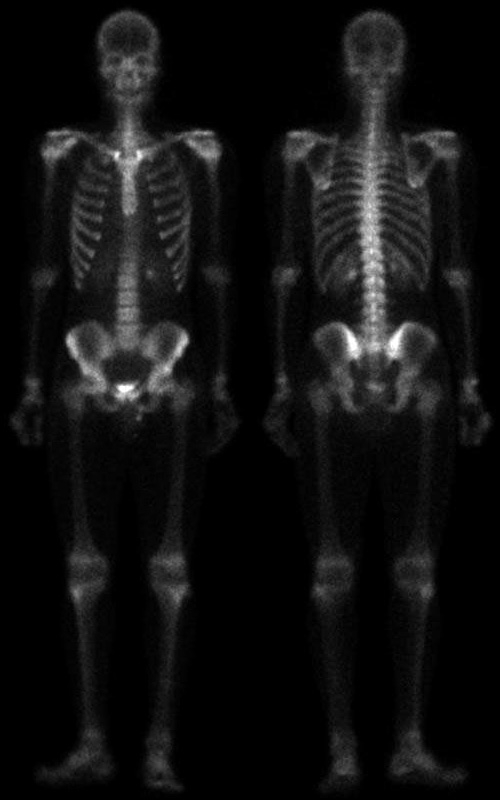

Imagem Original
(800, 500, 3)


In [ ]:
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0343(a)(skeleton_orig).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)

Filtro laplaciano


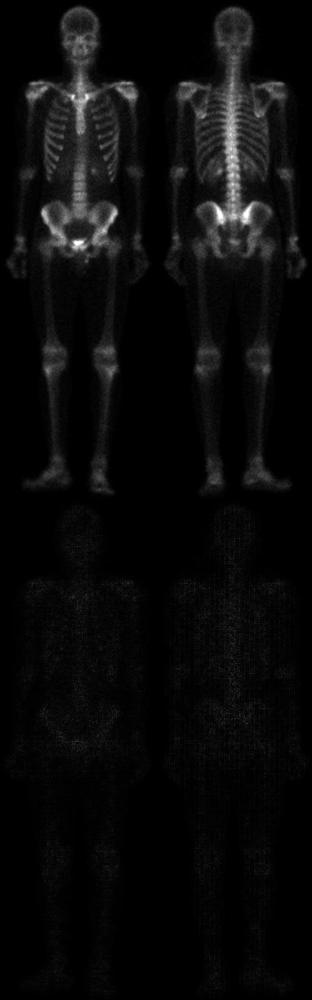

In [ ]:
#laplaciano
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0343(a)(skeleton_orig).tif')

img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
lap = cv2.Laplacian(img, cv2.CV_64F)
lap = np.uint8(np.absolute(lap))
resultado = np.vstack([img, lap])
print('Filtro laplaciano')
cv2_imshow(resultado)

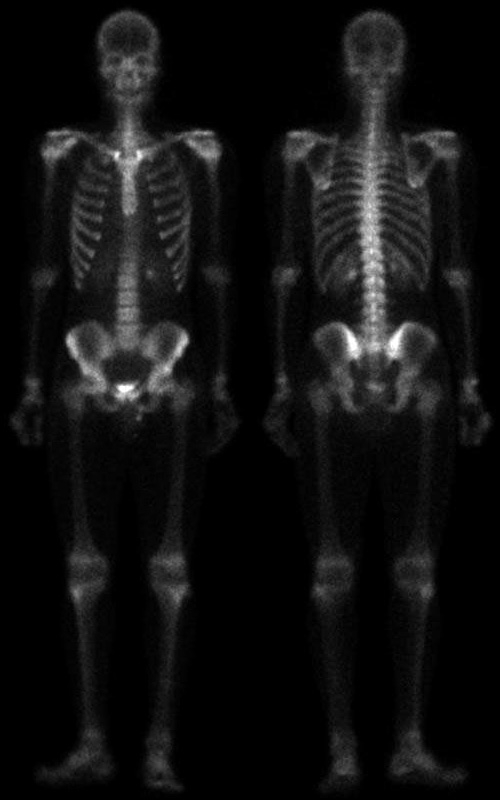

Imagem Original
(800, 500, 3)
Sobel X


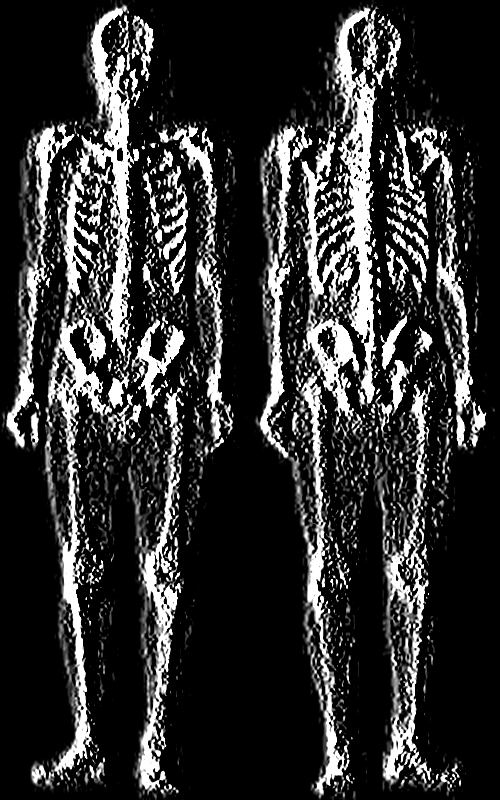

Sobel Y


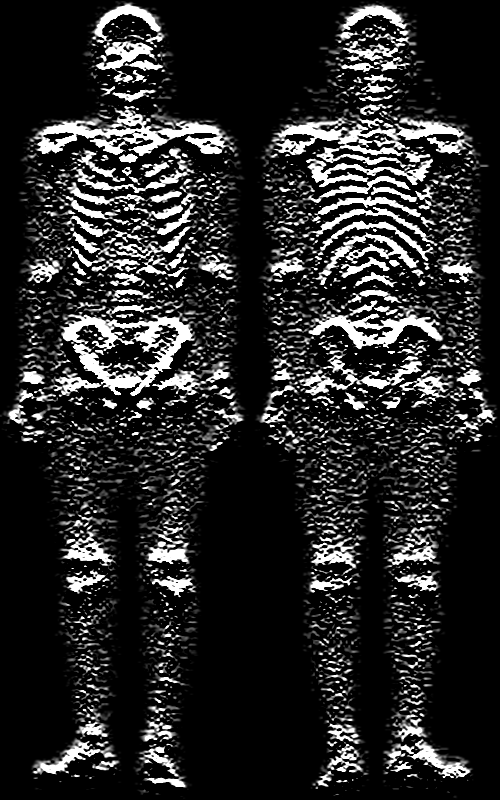

In [ ]:
#Gradiente de Sobel de (a)
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0343(a)(skeleton_orig).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)

sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

print('Sobel X')
cv2_imshow(sobelx)
print('Sobel Y')
cv2_imshow(sobely)

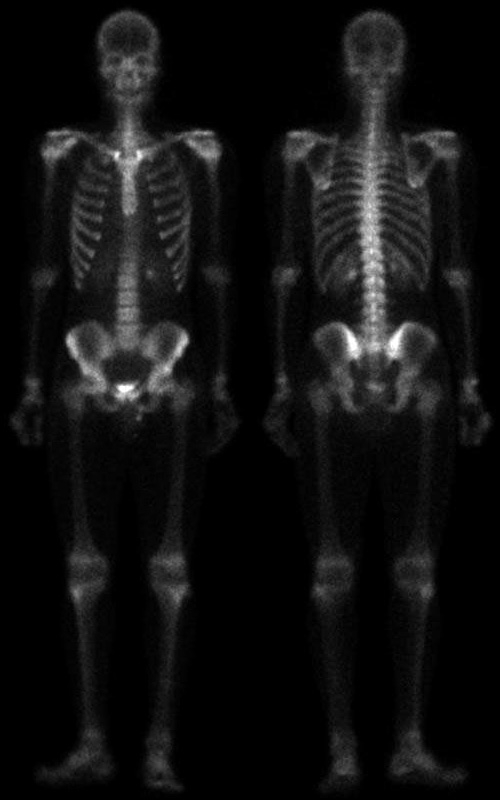

Imagem Original
(800, 500, 3)
Sobel X


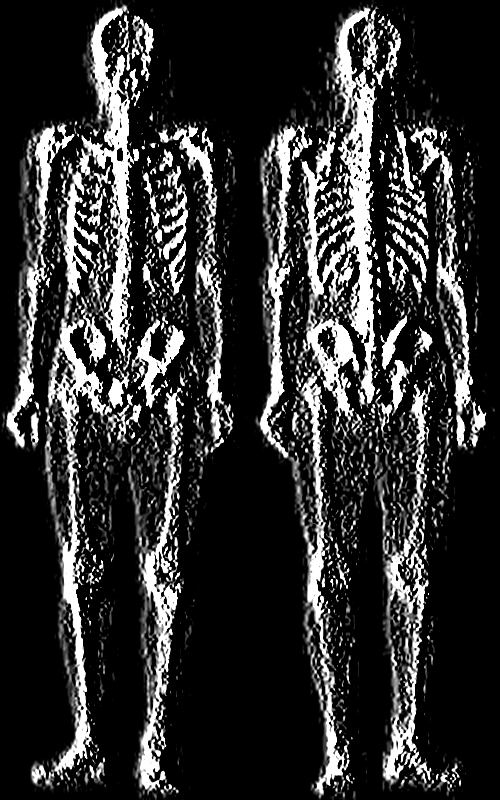

Sobel Y


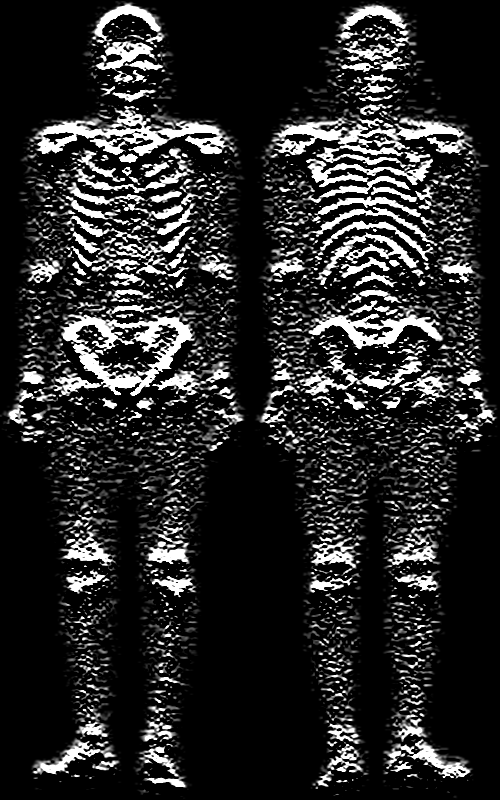

Filtro de media


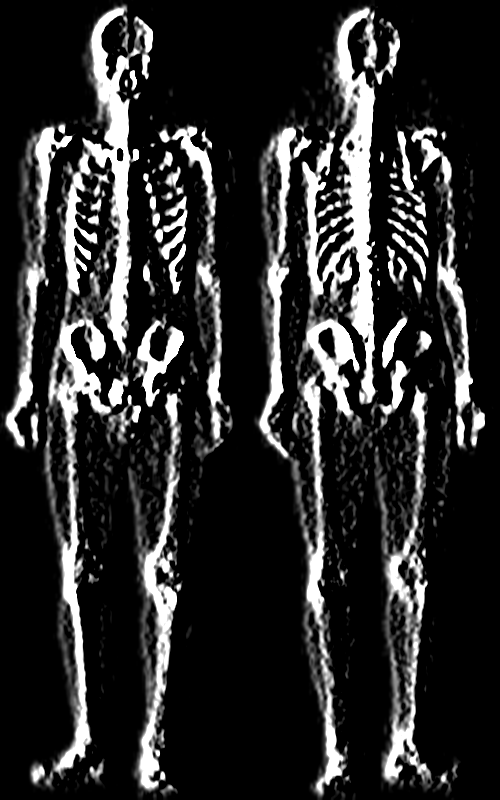

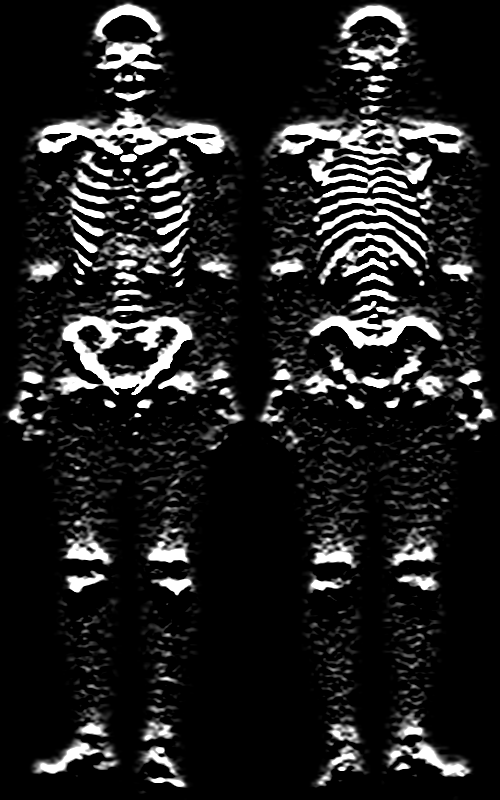

In [ ]:
#(d) suavizada com um filtro de média 5x5
img = cv2.imread('/gdrive/My Drive/Colab Notebooks/ProcessamentoImagem/Fig0343(a)(skeleton_orig).tif')

cv2_imshow(img)
print('Imagem Original')
print(img.shape)

sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

print('Sobel X')
cv2_imshow(sobelx)
print('Sobel Y')
cv2_imshow(sobely)

#filtro de media
print('Filtro de media')
filter_blurx=cv2.blur(sobelx,ksize=(5,5))
cv2_imshow(filter_blurx)
filter_blury=cv2.blur(sobely,ksize=(5,5))
cv2_imshow(filter_blury)